<a href="https://colab.research.google.com/github/priya1315/3104_Team18/blob/main/FollowYourPose.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://github.com/mayuelala/FollowYourPose/blob/main/quick_demo.ipynb)

# 🕺🕺🕺 Follow Your Pose 💃💃💃:
# Pose-Guided Text-to-Video Generation using Pose-Free Videos

[Yue Ma*](https://mayuelala.github.io/), [Yingqing He*](https://github.com/YingqingHe), [Xiaodong Cun](http://vinthony.github.io/), [Xintao Wang](https://xinntao.github.io/), [Ying Shan](https://scholar.google.com/citations?hl=zh-CN&user=4oXBp9UAAAAJ), [Xiu Li](https://scholar.google.com/citations?user=Xrh1OIUAAAAJ&hl=zh-CN), and [Qifeng Chen](https://cqf.io)


[![Project Website](https://img.shields.io/badge/Project-Website-orange)](https://follow-your-pose.github.io/)
[![arXiv](https://img.shields.io/badge/arXiv-2304.01186-b31b1b.svg)](https://arxiv.org/abs/2304.01186)
[![GitHub](https://img.shields.io/github/stars/mayuelala/FollowYourPose?style=social)](https://github.com/mayuelala/FollowYourPose)

In [1]:
#@markdown Check type of GPU and VRAM available.
!nvidia-smi --query-gpu=name,memory.total,memory.free --format=csv,noheader

Tesla T4, 15360 MiB, 15101 MiB


In [2]:
!sudo apt-get install python3.8
!sudo apt-get install python3.8-distutils

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  libpython3.8-minimal libpython3.8-stdlib mailcap mime-support
  python3.8-minimal
Suggested packages:
  python3.8-venv binfmt-support
The following NEW packages will be installed:
  libpython3.8-minimal libpython3.8-stdlib mailcap mime-support python3.8
  python3.8-minimal
0 upgraded, 6 newly installed, 0 to remove and 18 not upgraded.
Need to get 5,098 kB of archives.
After this operation, 18.9 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/main amd64 mailcap all 3.70+nmu1ubuntu1 [23.8 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/main amd64 mime-support all 3.66 [3,696 B]
Get:3 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy/main amd64 libpython3.8-minimal amd64 3.8.18-1+jammy1 [794 kB]
Get:4 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy/main amd64 python3.8-minima

# 🕺🕺🕺 Install Environment

In [3]:
!update-alternatives --install /usr/local/bin/python3 python3 /usr/bin/python3.8 2
!update-alternatives --install /usr/local/bin/python3 python3 /usr/bin/python3.9 1
!python --version
!apt-get update
!apt install software-properties-common
!sudo dpkg --remove --force-remove-reinstreq python3-pip python3-setuptools python3-wheel
!apt-get install python3-pip

print('Git clone project and install requirements...')
!git clone https://github.com/mayuelala/FollowYourPose.git

update-alternatives: using /usr/bin/python3.8 to provide /usr/local/bin/python3 (python3) in auto mode
update-alternatives: error: alternative path /usr/bin/python3.9 doesn't exist
Python 3.8.18
Get:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,626 B]
Hit:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Get:3 http://security.ubuntu.com/ubuntu jammy-security InRelease [110 kB]
Hit:4 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:5 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [119 kB]
Hit:6 https://ppa.launchpadcontent.net/c2d4u.team/c2d4u4.0+/ubuntu jammy InRelease
Get:7 http://archive.ubuntu.com/ubuntu jammy-backports InRelease [109 kB]
Hit:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Get:9 http://archive.ubuntu.com/ubuntu jammy-updates/universe amd64 Packages [1,269 kB]
Get:10 http://archive.ubuntu.com/ubuntu jammy-updates/main amd64 Packages [1,347 kB]
Hit:11 https://ppa.l

In [4]:
!cd /content/FollowYourPose
!export PYTHONPATH=/content/FollowYourPose:$PYTHONPATH
# %pip install -r requirements.txt
!python3.8 -m pip install -q -U --pre triton
!apt update
!python3.8 -m pip install -q diffusers==0.11.1 torch==1.13.1 transformers==4.26.0 bitsandbytes==0.35.4 \
imageio-ffmpeg xformers==0.0.16  --extra-index-url https://download.pytorch.org/whl/cu113



     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.2/89.2 MB 9.0 MB/s eta 0:00:00
Hit:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:3 http://security.ubuntu.com/ubuntu jammy-security InRelease
Hit:4 http://archive.ubuntu.com/ubuntu jammy InRelease
Hit:5 http://archive.ubuntu.com/ubuntu jammy-updates InRelease
Hit:6 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:7 https://ppa.launchpadcontent.net/c2d4u.team/c2d4u4.0+/ubuntu jammy InRelease
Hit:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:9 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:10 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
18 packages can be upgraded. Run 'apt list --upgradable' to see them.
     ━━━━━━━━━━━━━

In [5]:
%cd /content/FollowYourPose/
!python3.8 -m pip install -r requirements.txt

/content/FollowYourPose
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.5/126.5 KB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.7/199.7 KB 11.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 38.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 813.6/813.6 KB 57.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 KB 14.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.6/80.6 KB 9.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.0/60.0 KB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 31.4/31.4 MB 51.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 195.4/195.4 KB 17.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.6/96.6 KB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 300.0/300.0 KB 19.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

# 💃💃💃 Weight

In [6]:
%rm -rf /content/FollowYourPose/checkpoints
%mkdir checkpoints
!git lfs install
!git clone https://huggingface.co/YueMafighting/FollowYourPose_v1
%mv /content/FollowYourPose/FollowYourPose_v1/* /content/FollowYourPose/checkpoints/
%rm -rf FollowYourPose_v1

Updated git hooks.
Git LFS initialized.
Cloning into 'FollowYourPose_v1'...
remote: Enumerating objects: 42, done.
remote: Total 42 (delta 0), reused 0 (delta 0), pack-reused 42
Unpacking objects: 100% (42/42), 584.62 KiB | 5.62 MiB/s, done.
Filtering content: 100% (9/9), 9.75 GiB | 54.74 MiB/s, done.


# Setup
1. Storing videos into subfolders
2. Choose specific file to load from Charades folder
3. Watch playback of the video in 512x512 size

Choose Video from the data file so that we can load the video data

## Storing input videos into subfloders so that we can find the videos easily based on their types

In [7]:
#[GAI - 5, Team18-6]
import os
import gdown

charades_dir = "/content/FollowYourPose/data/charades"
youtube_dir = "/content/FollowYourPose/data/youtube"
sample_dir = "/content/FollowYourPose/data/sample"

# Create the destination directory if it doesn't exist
os.makedirs(charades_dir, exist_ok=True)
os.makedirs(youtube_dir, exist_ok=True)
os.makedirs(sample_dir, exist_ok=True)

charades_urls = [  # Charades video download links
    "https://drive.google.com/uc?export=download&id=1tPhla478lbM_cDS7bfcF0wHkTL5R3Kji",
    "https://drive.google.com/uc?export=download&id=1N5CdhFg3_27BrqpqRrX_isWOtLqw_jaV",
    "https://drive.google.com/uc?export=download&id=1DFwSop4UZ5nsN45xeqhKGTgt3RSYqIIO",
    "https://drive.google.com/uc?export=download&id=1DB3qeaYvORx4GPQzE0Fg_6USUGqRMxMM",
    "https://drive.google.com/uc?export=download&id=1rbwXibmCo3yWzhVHw-yF_P7zrAmRTX9q",
    "https://drive.google.com/uc?export=download&id=1_3-7sf486aptyk9p4_oG3E44Cd2_2ZZm",
    "https://drive.google.com/uc?export=download&id=1cloFzY429f63Ap0d5jXTKbU_mBCA-Krg",
    "https://drive.google.com/uc?export=download&id=18igx0FQwJf_7YkpoTHfwA2uEnMjgYvLd",
    "https://drive.google.com/uc?export=download&id=1FAwsmkxCkAzDvo3DevZCDfulVCKS3x63",
    "https://drive.google.com/uc?export=download&id=1QpAM74XNhvVSVdmmSXBWSkbIIKEw7JYZ"
]

youtube_url = [
    # Add YouTube video download links here
]

sample_url = [
    # Add sample video download links here
]

# Function to check if a file already exists
def file_exists(file_path):
    return os.path.isfile(file_path)

# Download files
for index, file_url in enumerate(charades_urls, start=1):
    file_name = os.path.join(charades_dir, f"Video_{index}.mp4")
    if file_exists(file_name):
        print(f"Charades file {file_name} already exists, skipping download.")
    else:
        gdown.download(file_url, file_name, quiet=False)
        print(f"Downloaded Charades file {index}: {file_name}")

# Download YouTube videos
for index, yt_url in enumerate(youtube_url, start=len(charades_urls) + 1):
    file_name = os.path.join(youtube_dir, f"Video_{index}.mp4")
    if file_exists(file_name):
        print(f"Youtube file {file_name} already exists, skipping download.")
    else:
        gdown.download(file_url, file_name, quiet=False)
        print(f"Downloaded Youtube file {index}: {file_name}")
    pass

# Download sample videos
for index, sample_url in enumerate(sample_url, start=len(charades_urls) + len(youtube_url) + 1):
    file_name = os.path.join(sample_dir, f"Video_{index}.mp4")
    if file_exists(file_name):
        print(f"Sample file {file_name} already exists, skipping download.")
    else:
        gdown.download(file_url, file_name, quiet=False)
        print(f"Downloaded Sample file {index}: {file_name}")
    pass

print("All files downloaded successfully.")



Downloading...
From: https://drive.google.com/uc?export=download&id=1tPhla478lbM_cDS7bfcF0wHkTL5R3Kji
To: /content/FollowYourPose/data/charades/Video_1.mp4
100%|██████████| 1.91M/1.91M [00:00<00:00, 116MB/s]


Downloaded Charades file 1: /content/FollowYourPose/data/charades/Video_1.mp4


Downloading...
From: https://drive.google.com/uc?export=download&id=1N5CdhFg3_27BrqpqRrX_isWOtLqw_jaV
To: /content/FollowYourPose/data/charades/Video_2.mp4
100%|██████████| 651k/651k [00:00<00:00, 90.5MB/s]


Downloaded Charades file 2: /content/FollowYourPose/data/charades/Video_2.mp4


Downloading...
From: https://drive.google.com/uc?export=download&id=1DFwSop4UZ5nsN45xeqhKGTgt3RSYqIIO
To: /content/FollowYourPose/data/charades/Video_3.mp4
100%|██████████| 1.33M/1.33M [00:00<00:00, 134MB/s]


Downloaded Charades file 3: /content/FollowYourPose/data/charades/Video_3.mp4


Downloading...
From: https://drive.google.com/uc?export=download&id=1DB3qeaYvORx4GPQzE0Fg_6USUGqRMxMM
To: /content/FollowYourPose/data/charades/Video_4.mp4
100%|██████████| 1.73M/1.73M [00:00<00:00, 76.7MB/s]


Downloaded Charades file 4: /content/FollowYourPose/data/charades/Video_4.mp4


Downloading...
From: https://drive.google.com/uc?export=download&id=1rbwXibmCo3yWzhVHw-yF_P7zrAmRTX9q
To: /content/FollowYourPose/data/charades/Video_5.mp4
100%|██████████| 2.58M/2.58M [00:00<00:00, 84.7MB/s]


Downloaded Charades file 5: /content/FollowYourPose/data/charades/Video_5.mp4


Downloading...
From: https://drive.google.com/uc?export=download&id=1_3-7sf486aptyk9p4_oG3E44Cd2_2ZZm
To: /content/FollowYourPose/data/charades/Video_6.mp4
100%|██████████| 1.92M/1.92M [00:00<00:00, 166MB/s]


Downloaded Charades file 6: /content/FollowYourPose/data/charades/Video_6.mp4


Downloading...
From: https://drive.google.com/uc?export=download&id=1cloFzY429f63Ap0d5jXTKbU_mBCA-Krg
To: /content/FollowYourPose/data/charades/Video_7.mp4
100%|██████████| 2.08M/2.08M [00:00<00:00, 151MB/s]


Downloaded Charades file 7: /content/FollowYourPose/data/charades/Video_7.mp4


Downloading...
From: https://drive.google.com/uc?export=download&id=18igx0FQwJf_7YkpoTHfwA2uEnMjgYvLd
To: /content/FollowYourPose/data/charades/Video_8.mp4
100%|██████████| 944k/944k [00:00<00:00, 115MB/s]


Downloaded Charades file 8: /content/FollowYourPose/data/charades/Video_8.mp4


Downloading...
From: https://drive.google.com/uc?export=download&id=1FAwsmkxCkAzDvo3DevZCDfulVCKS3x63
To: /content/FollowYourPose/data/charades/Video_9.mp4
100%|██████████| 2.60M/2.60M [00:00<00:00, 185MB/s]


Downloaded Charades file 9: /content/FollowYourPose/data/charades/Video_9.mp4


Downloading...
From: https://drive.google.com/uc?export=download&id=1QpAM74XNhvVSVdmmSXBWSkbIIKEw7JYZ
To: /content/FollowYourPose/data/charades/Video_10.mp4
100%|██████████| 2.81M/2.81M [00:00<00:00, 164MB/s]

Downloaded Charades file 10: /content/FollowYourPose/data/charades/Video_10.mp4
All files downloaded successfully.


# Choose video files from Charades project

In [8]:
# [GAI - 6, Team18-7]
# @title Choose specific video file to load

import ipywidgets as widgets
from ipywidgets import Layout, Box, Dropdown, Label
import os

# Get the list of folders in the data directory
video_path = os.path.join(os.getcwd(), '/content/FollowYourPose/data')
folders_in_path = [folder for folder in os.listdir(video_path) if os.path.isdir(os.path.join(video_path, folder))]

# Initialize dropdowns for choosing folder
folder_dropdown = widgets.Dropdown(options=folders_in_path, description='📂:', layout=Layout(width='50%'))
video_dropdown = widgets.Dropdown(description='▶️:', layout=Layout(width='50%')) # initially empty

#Layout
form_item_layout = Layout(
    display='flex',
    flex_flow='row',
    justify_content='space-between',
)

def update_video_dropdown(selected_folder):
    # Get the list of files in the selected folder
    files = [i for i in os.listdir(os.path.join(video_path, selected_folder)) if os.path.isfile(os.path.join(video_path, selected_folder, i))]
    video_dropdown.options = files
    # Handling of dropdown if no videos in selected folder
    video_dropdown.disabled = len(files) == 0
    video_dropdown.options = [f'No videos available in {selected_folder} folder'] if len(files) == 0 else files

def folder_dropdown_handler(change):
    selected_folder = change.new
    update_video_dropdown(selected_folder)
folder_dropdown.observe(folder_dropdown_handler, names='value')


initial_selected_folder = folder_dropdown.value
update_video_dropdown(initial_selected_folder)

# Form items - folder dropdown and video dropdown
form_items = [
    Box([Label(value='Choose a folder from the data directory'), folder_dropdown], layout=form_item_layout),
    Box([Label(value='Choose a video from the selected folder'), video_dropdown], layout=form_item_layout)
]

form = Box(form_items, layout=Layout(
    display='flex',
    flex_flow='column',
    border='solid 1px',
    align_items='stretch',
    width='50%',
    padding = '1%'
))

#display the elements
display(form)


def video_dropdown_handler(change):
    global chosen_video_dropdown_input
    chosen_video_dropdown_input = change.new
    print('\r', 'Chosen video:', chosen_video_dropdown_input, end='')
video_dropdown.observe(video_dropdown_handler, names='value')

Box(children=(Box(children=(Label(value='Choose a folder from the data directory'), Dropdown(description='📂:',…

 Chosen video: Video_4.mp4

# Show selected video from dropdown

In [9]:
!pip install MoviePy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 388.3/388.3 kB 7.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for MoviePy: filename=moviepy-1.0.3-py3-none-any.whl size=110727 sha256=361976e24255d8e1ea161898a70a352f0503042d591029d08c4c80d63fbf9eaf
  Stored in directory: /root/.cache/pip/wheels/b3/a1/e2/b255f1d3a8d18aae642d976b4f4432290c9222aefdce678499
Successfully built MoviePy


In [10]:
#[GAI - 7] -- Watch video playback
#[GAI - 35] -- Crop videos to 512x512
#@title Watch video playback, crop video to 512x512

from moviepy.editor import VideoFileClip
import os

if video_path == "/content/FollowYourPose/data/charades":
  clip = VideoFileClip(os.path.join(video_path, video_dropdown.value))
elif video_path == "/content/FollowYourPose/data":
  clip = VideoFileClip(os.path.join(video_path, folder_dropdown.value, video_dropdown.value))

orig_width, orig_height = clip.size
if orig_width > orig_height:
  margin_size = round((orig_width - orig_height) / 2)
  square_clip = clip.margin(top=margin_size, bottom=margin_size)
elif orig_width < orig_height:
  margin_size = round((orig_height - orig_width) / 2)
  square_clip = clip.margin(left=margin_size, right=margin_size)
else:
  square_clip = clip

resized_clip = square_clip.resize(width=512)

#saving the resized clip in a permanent location
resized_clip.write_videofile(os.path.join(video_path, folder_dropdown.value, video_dropdown.value.split(".")[0] + "_resized.mp4"))

resized_clip.ipython_display()

Moviepy - Building video /content/FollowYourPose/data/charades/Video_4_resized.mp4.
MoviePy - Writing audio in Video_4_resizedTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video /content/FollowYourPose/data/charades/Video_4_resized.mp4



t:  99%|█████████▉| 480/484 [00:10<00:00, 33.81it/s, now=None]WARNING:py.warnings:/usr/local/lib/python3.10/dist-packages/moviepy/video/io/ffmpeg_reader.py:123: UserWarning: Warning: in file /content/FollowYourPose/data/charades/Video_4.mp4, 460800 bytes wanted but 0 bytes read,at frame 483/484, at time 29.63/29.68 sec. Using the last valid frame instead.
  warnings.warn("Warning: in file %s, "%(self.filename)+



Moviepy - Done !
Moviepy - video ready /content/FollowYourPose/data/charades/Video_4_resized.mp4
Moviepy - Building video __temp__.mp4.
MoviePy - Writing audio in __temp__TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


# Inference

Loading Pre-trained model and adjusting clip timings so that I can customize the clip's duration

Recommended value = 8

Due to memory of GPU, we recommend set video_length=8 in ./config/pose_sample.yaml for running successfully.

Meanwhile, we should keep the skeleton frame length(./followyourpose/pipelines/pipeline_followyourpose.py:422 ) equal with video_length

In [ ]:
# @title Install Needed Libraries for mmpose
#[GAI - 11a & 11b, TEAM18-14 & TEAM18-63] - Choose video files from Charades project

!sudo apt-get install python3.8
!sudo apt-get install python3.8-distutils
# Set Python 3.8 as the default
!sudo update-alternatives --install /usr/bin/python3 python3 /usr/bin/python3.8 1
# Check Python version
!python3 --version
# Update system packages
!sudo apt update
!apt-get install python3-pip
# Check pip version for Python 3.8
!python3.8 -m pip --version

# Install PyTorch and related libraries for CUDA version 11.1 (cu117)
!pip install torch==2.0.0+cu117 torchvision==0.15.1+cu117 --index-url https://download.pytorch.org/whl/cu117

# Install OpenMMLab's OpenMIM
!pip install -U openmim

# Install the MMEngine package using OpenMIM
!mim install mmengine

# Install mmcv package (a dependency) with a minimum version of 2.0.0
!mim install "mmcv>=2.0.0"

# Install mmdet package (a dependency) with a minimum version of 3.1.0 using OpenMIM
!mim install "mmdet>=3.1.0"

# Clone the mmpose repository from GitHub
!git clone https://github.com/open-mmlab/mmpose.git

# Change the working directory to the cloned mmpose repository
%cd mmpose

# Install the requirements specified in the repository's requirements.txt
!pip install -r requirements.txt

# Install mmpose as an editable package in your environment
!pip install -v -e .

# Install mmpose package (a dependency) with a minimum version of 1.1.0
!mim install "mmpose>=1.1.0"

# Install opencv-python-headless package
!pip install opencv-python-headless

# Install bitsandbytes
!pip install --upgrade bitsandbytes

In [ ]:
#[GAI - 9] - Choose video files from Charades project
!pip install ipywidgets

In [ ]:
#[GAI - 9, TEAM18-10] - Choose video files from Charades project
# @title Choose video files from Charades project

import ipywidgets as widgets
from ipywidgets import Layout, Box, Dropdown, Label
import os

video_path = os.path.join(os.getcwd(),'/content/FollowYourPose/data/charades')

#get all videos into a list
files = [i for i in os.listdir(video_path) if os.path.isfile(os.path.join(video_path, i))]

#Layout
form_item_layout = Layout(
    display='flex',
    flex_flow='row',
    justify_content='space-between',
)

#dropdown initialization with filenames
video_dropdown_input = 'Dropdown_input'
video_dropdown = widgets.Dropdown(description='▶️:',options=(files), layout=Layout(width='50%'))
# Handling of dropdown if no videos in selected folder
video_dropdown.disabled = len(files) == 0
video_dropdown.options = [f'No videos available in charades folder'] if len(files) == 0 else files

def dropdown_handler(change):
    global video_dropdown_input
    print('\r','Chosen video: ' + str(change.new),end='')
    video_dropdown_input = change.new
video_dropdown.observe(dropdown_handler, names='value')

#form items -- label and dropdown
form_items = [
    Box([Label(value='Choose a video from the Charades project folder'),
         video_dropdown], layout=form_item_layout)]

form = Box(form_items, layout=Layout(
    display='flex',
    flex_flow='column',
    border='solid 1px',
    align_items='stretch',
    width='50%',
    padding = '1%'
))

#display the elements
display(form)
print('\r','Chosen video: ' + video_dropdown.value, end='')

Box(children=(Box(children=(Label(value='Choose a video from the Charades project folder'), Dropdown(descripti…

 Chosen video: Video_8.mp4

In [69]:
#[GAI-4, TEAM18-9]
#[GAI-8, TEAM18-9]
#[GAI-22, TEAM18-9]

import ipywidgets as widgets
from ipywidgets import HBox, Label
from ipywidgets import Layout, Button, Box, FloatText, Textarea, Dropdown, Label, IntSlider
import time
import pandas as pd
import os
from IPython.display import display

path = os.path.join(os.getcwd(), '/content/FollowYourPose/checkpoints/')

folder_names = [name for name in os.listdir(path) if os.path.isdir(os.path.join(path, name)) and name != "followyourpose_checkpoint-1000"]

# Layout
form_item_layout = Layout(
    display='flex',
    flex_flow='row',
    justify_content='space-between',
)
folder_names.insert(0, "")

# IntText widget
video_length_widget = widgets.IntText(
    value=0,
    layout=Layout(width='50%')  # Adjust the width as needed
)

# Dropdown widget
folder_dropdown = widgets.Dropdown(
    options=folder_names,
    layout=Layout(width='50%')  # Adjust the width as needed
)


# Event handler for dropdown
def inttext_handler(change):
    global video_length
    print('\r','Chosen video length: ' + str(change.new), end='')
    video_length = change.new

video_length_widget.observe(inttext_handler, names='value')

# Event handler for dropdown
def dropdown_handler(change):
    global drop_down_input
    print('\r','Chosen pre-trained model: ' + str(change.new), end='')
    drop_down_input = change.new

folder_dropdown.observe(dropdown_handler, names='value')

# Button
button = widgets.Button(description="Generate")

# Event handler for button click
def on_button_click(b):
    video_length = video_length_widget.value
    if drop_down_input == "Dropdown_input_1":
        print("\n Please choose a file")
    else:
        file_path = open("/content/FollowYourPose/configs/pose_sample.yaml", "r")
        with open("/content/FollowYourPose/configs/pose_sample.yaml", "r") as file:
            lines = file.readlines()
        if lines:
            # Modify the first line (assuming you want to replace it)
            new_first_line = 'pretrained_model_path: "./checkpoints/' + drop_down_input + '"\n'
            new_tenth_line = '  video_length: ' + str(video_length) + '\n'
            lines[0] = new_first_line
            lines[9] = new_tenth_line
            # Open the file in write mode to save the modified content
            with open("/content/FollowYourPose/configs/pose_sample.yaml", "w") as file:
                file.writelines(lines)
            print("\nLine has been changed")

# Link the function to the button
button.on_click(on_button_click)

# Form items
form_items = [
    Box([Label(value='Choose a Pre-trained Model'), folder_dropdown], layout=form_item_layout),
    Box([Label(value='Enter Video Length(in seconds)'), video_length_widget], layout=form_item_layout)  # Added IntText widget
]

# Create the form
form = Box(form_items, layout=Layout(
    display='flex',
    flex_flow='column',
    border='solid 1px',
    align_items='stretch',
    width='100%',
    padding='1%'
))

# Display the form and button
display(form)
display(button)


Box(children=(Box(children=(Label(value='Choose a Pre-trained Model'), Dropdown(layout=Layout(width='50%'), op…

Button(description='Generate', style=ButtonStyle())

 Chosen pre-trained model: stable-diffusion-v1-4

After selecting pretrained model and setting video length, Choose where you would like to save the video to.

In [ ]:
# [GAI - 26, Team18-19]
# @title Choose Location where videos are outputted to


#@markdown Please provide the name of the directory where the video should be saved.
OUTPUT_DIR = "output/samples" #@param {type:"string" }

# Changing save_path in txt2video.py
path = os.path.join(os.getcwd(), '/content/FollowYourPose/txt2video.py')

a_file = open(path, "r")
list_of_lines = a_file.readlines()
start_index_171 = list_of_lines[171 -1].find('"') + 1
end_index_171 = list_of_lines[171 -1].rfind('"')

start_index_174 = list_of_lines[174 -1].find('"') + 1
end_index_174 = list_of_lines[174 -1].rfind('"')

# Line 171 OG: 6tabs save_videos_grid(sample, f"{output_dir}/inference/sample-{global_step}-{str(seed)}-{now}/{prompt}.gif")
list_of_lines[171 -1] = list_of_lines[171 -1][:start_index_171] + f"{OUTPUT_DIR}/sample-{{global_step}}-{{str(seed)}}-{{now}}/{{prompt}}.gif" + list_of_lines[171 -1][end_index_171:]

# Line 174 OG: 4tabs save_path = f"{output_dir}/inference/sample-{global_step}-{str(seed)}-{now}.gif"
list_of_lines[174 -1] = list_of_lines[174 -1][:start_index_174] + f"{OUTPUT_DIR}/sample-{{global_step}}-{{str(seed)}}-{{now}}.gif" + list_of_lines[174 -1][end_index_174:]

a_file = open("txt2video.py", "w")
a_file.writelines(list_of_lines)
a_file.close()

print(f"[*] Videos will be saved at {OUTPUT_DIR}/...")
!mkdir -p $OUTPUT_DIR


[*] Videos will be saved at output/samples/...


In [ ]:
# @title Edit prompts
# @markdown Click the dropdown to select the config file the model will be using.
# @markdown To edit prompts, simply change the text.
# @markdown The program will save your changes automatically.

# Team18-12

import os
import ipywidgets as widgets
from IPython.display import clear_output
import yaml

selected_config_file_name = 'pose_sample.yaml' # default file/ needed for 1st run

# To fix the yaml saving indents improperly hehe
class IndentDumper(yaml.Dumper):
    def increase_indent(self, flow=False, indentless=False):
        return super(IndentDumper, self).increase_indent(flow, False)

# Assigning prompts from yaml
config_path = os.path.join(os.getcwd(), '/content/FollowYourPose/configs')

# Function to load prompts from selected YAML file
def load_prompts_from_file(file_name):
    with open(os.path.join(config_path, file_name)) as f:
        config = yaml.safe_load(f)
    return config['validation_data']['prompts']

# Dropdown widget to select YAML file
yaml_files = [file for file in os.listdir(config_path) if file.endswith('.yaml')]
yaml_dropdown = widgets.Dropdown(options=yaml_files, value=selected_config_file_name,description='Config File📮')

# Event handler for dropdown change
def handle_yaml_change(change):
    global prompts, selected_config_file_name
    selected_config_file_name = change.new
    prompts = load_prompts_from_file(change.new)
    reset_cell_display()

yaml_dropdown.observe(handle_yaml_change, names='value')
tags_container = widgets.VBox() # Container for all widgets

# Creating widgets for each prompt
def initialize_widgets(prompts):
    global text_widgets, delete_buttons
    text_widgets = [widgets.Text(value=prompt, description='Prompt {}'.format(i + 1)) for i, prompt in enumerate(prompts)]
    delete_buttons = [widgets.Button(description='Delete', layout=widgets.Layout(width='70px')) for _ in text_widgets]
    for i, delete_button in enumerate(delete_buttons):
        delete_button.on_click(lambda event, index=i: handle_delete(event, index))
    for index, text_widget in enumerate(text_widgets):
        text_widget.observe(lambda change, index=index: handle_text_change(change, index), names='value')

new_prompt_widget = widgets.Text(description='New Prompt:', placeholder='Enter a new prompt...')
add_prompt_button = widgets.Button(description='Add Prompt') # Add prompt btn

def add_prompt(sender):
    new_prompt = new_prompt_widget.value.strip()
    if new_prompt:
        new_text_widget = widgets.Text(value=new_prompt, description='Prompt {}'.format(len(text_widgets) + 1))
        text_widgets.append(new_text_widget)
        delete_button = widgets.Button(description='Delete', layout=widgets.Layout(width='70px'))
        delete_buttons.append(delete_button)
        new_text_widget.observe(lambda change, index=len(text_widgets)-1: handle_text_change(change, index), names='value')
        delete_button.on_click(lambda event, index=len(text_widgets)-1: handle_delete(event, index))

        # Add the new prompt to .yaml config
        with open(os.path.join(config_path, selected_config_file_name)) as f:
            config = yaml.safe_load(f)
        config['validation_data']['prompts'].append(new_prompt)
        with open(os.path.join(config_path, selected_config_file_name), 'w') as f:
            yaml.dump(config, f, sort_keys=False, Dumper=IndentDumper)

    new_prompt_widget.value = ''
    update_tags_container()

add_prompt_button.on_click(add_prompt) # onCLick event

# Update display of prompts
def update_tags_container():
    tags_container.children = [yaml_dropdown] + [widgets.HBox([text_widget, delete_button]) for text_widget, delete_button in zip(text_widgets, delete_buttons)] + [new_prompt_widget, add_prompt_button]


def handle_text_change(change, index):
    # If textfield change, write to file
    if change['type'] == 'change':
        with open(os.path.join(config_path, selected_config_file_name)) as f:
            config = yaml.safe_load(f)
        config['validation_data']['prompts'][index] = change['new'].strip()
        with open(os.path.join(config_path, selected_config_file_name), 'w') as f:
            yaml.dump(config, f, sort_keys=False, Dumper=IndentDumper)

    # If textfield empty, delete
    if not change['new'].strip():
        handle_delete(None, index)

def handle_delete(event, index):
    with open(os.path.join(config_path, selected_config_file_name)) as f:
        config = yaml.safe_load(f)
    del config['validation_data']['prompts'][index]
    with open(os.path.join(config_path, selected_config_file_name), 'w') as f:
        yaml.dump(config, f, sort_keys=False, Dumper=IndentDumper)
    reset_cell_display()            # Refresh cell display

def reset_cell_display():
    prompts = load_prompts_from_file(selected_config_file_name)
    clear_output()              # Clear cell display of
    initialize_widgets(prompts) # Re-initialize widgets
    update_tags_container()     # Update tags container
    display(tags_container)     # Display the tags container

reset_cell_display()            # Refresh cell display


### Creation of Skeleton Video

In [ ]:
#GAI 11A - inference
# @title Skeleton Video using mmpose
from IPython.display import HTML, display, Video, clear_output
from ipywidgets import widgets, Output, interactive
import ipywidgets as widgets
from moviepy.editor import VideoFileClip
from ipywidgets import HBox
import os
import time
import subprocess
import yaml

# Choosen pre-trained model
file_path = '/content/FollowYourPose/configs/pose_sample.yaml'
with open(file_path, 'r') as file:
    config = yaml.safe_load(file)
current_pretrained_model_path = config.get('pretrained_model_path', '')

# Choose Video
clip_path = os.path.join('/content/FollowYourPose/data/charades', video_dropdown.value)
video_filename = os.path.splitext(os.path.basename(clip_path))[0]  # Remove ".mp4" extension
filepath_name = os.path.splitext(os.path.basename(current_pretrained_model_path))[0]  # Remove ".mp4" extension

print('Current pretrained_model path:', filepath_name)
print('Current video:', video_filename)\
print("This will take about 1-5mins...")
print("\n")

#dropdown to select video format
video_format = widgets.Dropdown(
    options=["2D Video Test", "2D Whole Body Video Test", "3D Video Test"],
    description="Select format:"
)

# Inference function

def inference(selected_format):
    vis_out_dir = "skeleton_output/Visualization"  # Visualization output directory
    os.makedirs(vis_out_dir, exist_ok=True)

    if selected_format == "2D Video Test":
        !python demo/inferencer_demo.py \
            "{clip_path}" \
            --pose2d human --vis-out-dir "{vis_out_dir}" --black-background

        # Define the expected output video path
        expected_output_video_path = f'/content/FollowYourPose/mmpose/skeleton_output/Visualization/{video_filename}.mp4'  # Replace with the actual path

        if os.path.exists(expected_output_video_path):
            clear_output(wait=True)
            print(f"Video saved to Path: {vis_out_dir}.")
        else:
            print("Error, try reinstalling needed libraries again")

    elif selected_format == "3D Video Test":
        !python demo/inferencer_demo.py \
            "{clip_path}" \
            --pose3d human3d --vis-out-dir "{vis_out_dir}"  --black-background
        clear_output(wait=True)
        # Define the expected output video path
        expected_output_video_path = f'/content/FollowYourPose/mmpose/skeleton_output/Visualization/{video_filename}.mp4'  # Replace with the actual path

        if os.path.exists(expected_output_video_path):
            clear_output(wait=True)
            print(f"Video saved to Path: {vis_out_dir}.")
        else:
            print("Error, try reinstalling needed libraries again")


    elif selected_format == "2D Whole Body Video Test":
        !python demo/inferencer_demo.py \
            "{clip_path}" \
            --pose2d wholebody --vis-out-dir "{vis_out_dir}" --black-background
        clear_output(wait=True)
        # Define the expected output video path
        expected_output_video_path = f'/content/FollowYourPose/mmpose/skeleton_output/Visualization/{video_filename}.mp4'  # Replace with the actual path

        if os.path.exists(expected_output_video_path):
            clear_output(wait=True)
            print(f"Video saved to Path: {vis_out_dir}.")
        else:
            print("Error, try reinstalling needed libraries again")



# Button widget to trigger inference
inference_button = widgets.Button(description="Run Inference")

# Define a function to handle button click
def on_inference_button_click(b):
    selected_format = video_format.value
    inference(selected_format)

# Attach the button click event handler
inference_button.on_click(on_inference_button_click)

# Display widgets
display(HBox([video_format, inference_button]))


Video saved to Path: skeleton_output/Visualization.


In [ ]:
#GAI 11A - inference
# @title Video Player Selector
from moviepy.editor import VideoFileClip, clips_array

# Define the source video folder and visualization folder paths
source_folder = '/content/FollowYourPose/data/charades'
visualization_folder = '/content/FollowYourPose/mmpose/skeleton_output/Visualization'

# Initialize the paths as global variables
original_path = ""
skeleton_path = ""

# Function to get a list of video files in a folder
def get_video_files(folder):
    if os.path.exists(folder) and os.path.isdir(folder):
        video_files = [f for f in os.listdir(folder) if f.endswith('.mp4')]
        return video_files
    else:
        return []

# Create a dropdown for selecting the source video
source_video_dropdown = widgets.Dropdown(
    options=get_video_files(source_folder),
    description='Select Original Video:'
)

# Create a dropdown for selecting the visualization video
visualization_video_dropdown = widgets.Dropdown(
    options=get_video_files(visualization_folder),
    description='Select Skeleton Video:'
)

def Save_Option(change):
  global original_path  # Use the global keyword to modify the global variable
  global skeleton_path
  original_path = os.path.join(source_folder,source_video_dropdown.value)
  skeleton_path = os.path.join(visualization_folder,visualization_video_dropdown.value)
  print("Saved Option")

# Create a button to play the videos
play_button = widgets.Button(description="Save Option")
play_button.on_click(Save_Option)

# Display the widgets
print("Pick the original video that was selected before generating the skeleton video and pick the same video name for the skeleton video.")
display(source_video_dropdown)
display(visualization_video_dropdown)
display(play_button)

Pick the original video that was selected before generating the skeleton video and pick the same video name for the skeleton video.


Dropdown(description='Select Original Video:', options=('Video_10.mp4', 'Video_2.mp4', 'Video_5.mp4', 'Video_1…

Dropdown(description='Select Skeleton Video:', options=('Video_8.mp4',), value='Video_8.mp4')

Button(description='Save Option', style=ButtonStyle())

Saved Option


In [ ]:
#GAI 11A - inference
# @title Video Player for inference Original vs Skeleton comparison
from moviepy.editor import VideoFileClip, clips_array

print(f"\nOriginal Video Path is {original_path}")
print(f"Skeleton Video Path is {skeleton_path}")

# Load the two video clips
video1 = VideoFileClip(original_path)
video2 = VideoFileClip(skeleton_path)

# Resize the video clips
video1 = video1.resize(width=300)
video2 = video2.resize(width=300)

# Create an overlay by placing video2 on the right of video1
final_video = clips_array([[video1, video2]])

# Display the overlay video
final_video.ipython_display()



Original Video Path is /content/FollowYourPose/data/charades/Video_8.mp4
Skeleton Video Path is /content/FollowYourPose/mmpose/skeleton_output/Visualization/Video_8.mp4
Moviepy - Building video __temp__.mp4.
MoviePy - Writing audio in __temp__TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video __temp__.mp4



t:  99%|█████████▉| 763/767 [00:05<00:00, 148.24it/s, now=None]WARNING:py.warnings:/usr/local/lib/python3.10/dist-packages/moviepy/video/io/ffmpeg_reader.py:123: UserWarning: Warning: in file /content/FollowYourPose/data/charades/Video_8.mp4, 388800 bytes wanted but 0 bytes read,at frame 766/767, at time 25.56/25.59 sec. Using the last valid frame instead.
  warnings.warn("Warning: in file %s, "%(self.filename)+

  warnings.warn("Warning: in file %s, "%(self.filename)+

                                                               

Moviepy - Done !
Moviepy - video ready __temp__.mp4


### Skeleton to Inference Video

In [ ]:
# GAI-11b Display Video & Caption
# @title Install Upgrades
!pip install --upgrade accelerate
!pip install --upgrade xformers

In [ ]:
# GAI 11A - inference
# GAI-11b Display Video & Caption
# @title Run FollowYourPose
%cd /content/FollowYourPose
!pwd
!TORCH_DISTRIBUTED_DEBUG=DETAIL accelerate launch txt2video.py --config="configs/pose_sample.yaml"  --skeleton_path="{skeleton_path}"

output/samples


## Iron man in the sky

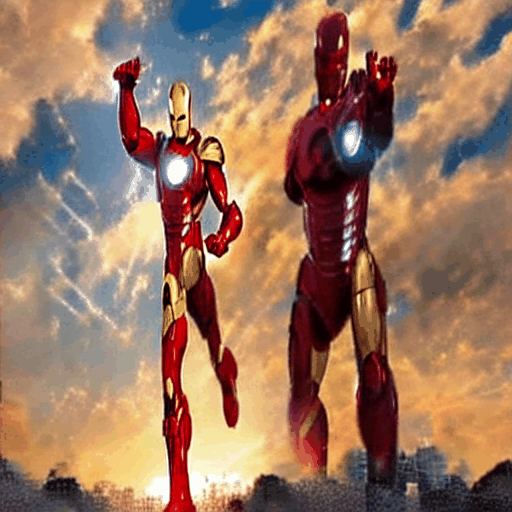

## Astronaut in space

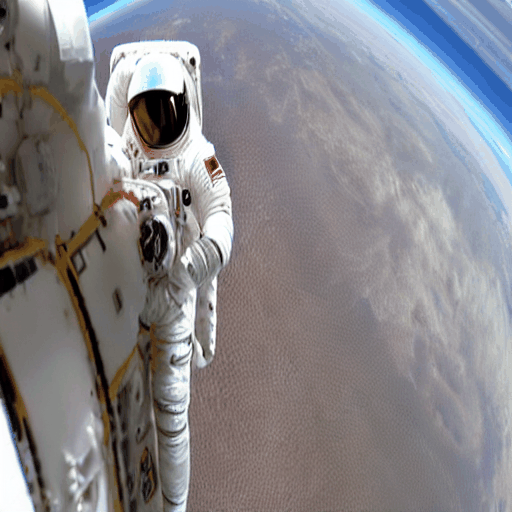

## Spiderman on the beach

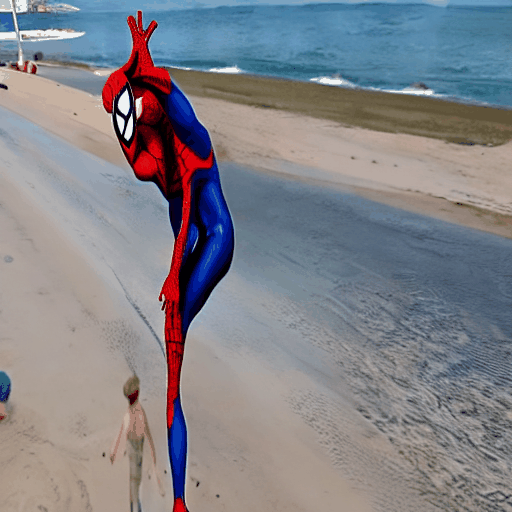

In [ ]:
# @title Play the Video output with caption
# GAI-11b Display Video & Caption
import os
from IPython.display import Image, display, Markdown

# From GAI-26
search_directory = OUTPUT_DIR

# Search for GIF files in the directory and its subdirectories
for root, dirs, files in os.walk(search_directory):
    for file in files:
        if file.lower().endswith('.gif') and not file.lower().startswith('sample'):
            # Construct the full path to the GIF file
            gif_path = os.path.join(root, file)
            # Extract the file name from the path and remove the file extension
            gif_title = os.path.splitext(file)[0]
            # Display the title
            display(Markdown(f'## {gif_title}'))
            # Display the GIF
            display(Image(filename=gif_path))


# Training

In [ ]:
# @title Step 1: Save model to the model file
#[GAI - 14 , TEAM 18 - 27]
#[GAI - 19 , TEAM 18 - 32]

import os
import ipywidgets as widgets

# Create directories if they don't exist
os.makedirs("/content/FollowYourPose/model", exist_ok=True)

# Define the save folder
save_folder = "/content/FollowYourPose/model"

# Create a text widget for entering the model name
model_name_widget = widgets.Text(description='Model Name:', placeholder='Enter model name...')
display(model_name_widget)  # Display the widget to the user

# Function to handle the model name submission
def save_model(sender):
    model_name = model_name_widget.value  # Get the entered model name

    # Ensure the file name has a ".txt" extension
    if not model_name.endswith(".txt"):
        model_name += ".txt"

    # Check if the model name is already in use
    if os.path.exists(os.path.join(save_folder, model_name)):
        print(f"The model name '{model_name}' is already in use. Please enter a unique name.")
    else:
        # Specify the file content you want to save
        file_content = "This is the content of the file."

        # Create the full path to the file in the selected folder
        file_path = os.path.join(save_folder, model_name)

        try:
            with open(file_path, "w") as file:
                file.write(file_content)
            print(f"File '{model_name}' has been saved in '{save_folder}'.")
        except Exception as e:
            print(f"An error occurred: {e}")

# Add an event handler for the button click
save_button = widgets.Button(description="Save Model")
save_button.on_click(save_model)
display(save_button)


File 'example.txt' has been saved in '/content/FollowYourPose/model'.


## Creating a file to store pretrained model

In [ ]:
#@title Creating config file for new model using this save_folder as the output

#@markdown Train config

#from omegaconf import OmegaConf
import os
import yaml

CONFIG_NAME =  "/content/FollowYourPose/configs/man-sitting.yaml" #@param {type:"string"} #new model anme

train_prompt = "a man is sitting" #@param {type:"string"} #training prompt
video_length = 8 #@param {type:"number"}
width = 512
height = 512
learning_rate = 3e-5 #@param {type:"number"}
train_steps = 100 #@param {type:"number"}

if video_path == "/content/FollowYourPose/data/charades":
  video_full_path = os.path.join("./data", video_dropdown.value)
elif video_path == "/content/FollowYourPose/data":
  video_full_path = os.path.join("./data", folder_dropdown.value, video_dropdown.value)


config = {
  "pretrained_model_path": './checkpoints/stable-diffusion-v1-4', #where the pretrained model is from
  #^ to be changed accordingly when selecting other models, check model dropdown codes
  "output_dir": save_folder, #where the new model with weights, stable-diffusion, sample gifs etc. is supposed to be saved
  "train_data": {
    "video_path": video_full_path, #the selected video for training
    "prompt": train_prompt,
    "n_sample_frames": video_length,
    "width": width,
    "height": height,
    "sample_start_idx": 0,
    "sample_frame_rate": 2,
  },
  "validation_data": {
    "prompts": [
      "mickey mouse is sitting on the floor",
      "spider man is sitting on the car hood",
      "wonder woman is sitting in a car",
      "a man, wearing pink clothes, is sitting on a chair",
    ],
    "video_length": video_length,
    "width": width,
    "height": height,
    "num_inference_steps": 20,
    "guidance_scale": 12.5,
    "use_inv_latent": True,
    "num_inv_steps": 50,
  },
  "learning_rate": learning_rate,
  "train_batch_size": 1,
  "max_train_steps": train_steps,
  "checkpointing_steps": 1000,
  "validation_steps": 100,
  "trainable_modules": [
    "attn1.to_q",
    "attn2.to_q",
    "attn_temp",
  ],
  "seed": 33,
  "mixed_precision": "fp16",
  "use_8bit_adam": False,
  "gradient_checkpointing": True,
  "enable_xformers_memory_efficient_attention": True,
}

try:
  newConfigFile = open(CONFIG_NAME, 'w')
  yaml.dump(config, newConfigFile, sort_keys=False)
  newConfigFile.close()
  print(f"The config has been saved in '{CONFIG_NAME}'.")
except Exception as e:
  print(f"An error occurred: {e}")

#OmegaConf.save(config, CONFIG_NAME) #i think this is supposed to overwrite/add a new config file everytime you run it?

The config has been saved in '/content/FollowYourPose/configs/man-sitting.yaml'.


In [11]:
#@title Training process from the yaml file created above
#remember to change the checkpoint_steps to 500?
#pose_train.yaml must change the video_length to 8 and change the skeleton_path
#copy paste the new HDvila file to the one here and do so for the rest of the txt file in the github as well
#create ur own csv file. Msg priya if u want the csv file(if lazy)
#data/charades/path_1/video_1.mp4 (create this path so the csv will work)
#!accelerate launch train_followyourpose.py --config=CONFIG_NAME
!accelerate launch train_followyourpose.py --config="configs/pose_train.yaml" --skeleton_path="/content/FollowYourPose/data/charades/part_1/video_clips/Video_1.mp4"

The following values were not passed to `accelerate launch` and had defaults used instead:
	`--num_processes` was set to a value of `1`
	`--num_machines` was set to a value of `1`
	`--mixed_precision` was set to a value of `'no'`
	`--dynamo_backend` was set to a value of `'no'`
To avoid this warning pass in values for each of the problematic parameters or run `accelerate config`.
A matching Triton is not available, some optimizations will not be enabled.
Error caught was: module 'triton.language' has no attribute 'constexpr'
/usr/local/lib/python3.8/dist-packages/torchvision/transforms/_functional_video.py:6: UserWarning: The 'torchvision.transforms._functional_video' module is deprecated since 0.12 and will be removed in the future. Please use the 'torchvision.transforms.functional' module instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/transforms/_transforms_video.py:22: UserWarning: The 'torchvision.transforms._transforms_video' module is deprecated sinc

In [42]:
# @title Step #: Choose a dataset subfolder from the data folder to use for the training
# Get the list of folders in the data directory
video_path = os.path.join(os.getcwd(), '/content/FollowYourPose/data')
folders_in_path = [folder for folder in os.listdir(video_path) if os.path.isdir(os.path.join(video_path, folder))]


# Initialize dropdowns for choosing folder
folder_dropdown_dataset = widgets.Dropdown(options=folders_in_path, description='📂:', layout=Layout(width='50%'))
choosenfolder_dropdown = widgets.Dropdown( options ="",description='📂:', layout=Layout(width='50%')) # initially empty


#Layout
form_item_layout = Layout(
    display='flex',
    flex_flow='row',
    justify_content='space-between',
)



def folder_dropdown_dataset_handler(change):
    global selected_folder
    selected_folder = change.new
    update_video_dropdown(change.new)
folder_dropdown_dataset.observe(folder_dropdown_dataset_handler, names='value')

def update_video_dropdown(selected_folder):

    # Get the list of files in the selected folder
    files = [i for i in os.listdir(os.path.join(video_path, selected_folder)) if os.path.isdir(os.path.join(video_path, selected_folder, i))]
    choosenfolder_dropdown.options = files
    # Handling of dropdown if no videos in selected folder
    choosenfolder_dropdown.disabled = len(files) == 0
    choosenfolder_dropdown.options = [f'No videos available in {selected_folder} folder'] if len(files) == 0 else files

#initial_selected_folder = folder_dropdown_dataset.value
#update_video_dropdown(initial_selected_folder)









# Form items - folder dropdown and video dropdown
form_items = [
    Box([Label(value='Choose a folder from the data directory'), folder_dropdown_dataset], layout=form_item_layout),
    Box([Label(value='Choose a folder from the selected folder'), choosenfolder_dropdown], layout=form_item_layout)
]

form = Box(form_items, layout=Layout(
    display='flex',
    flex_flow='column',
    border='solid 1px',
    align_items='stretch',
    width='50%',
    padding = '1%'
))

#display the elements
display(form)

def choosenfolder_dropdown_handler(change):
    global chosen_folder_dropdown_input
    chosen_folder_dropdown_input = change.new
choosenfolder_dropdown.observe(choosenfolder_dropdown_handler, names='value')




Box(children=(Box(children=(Label(value='Choose a folder from the data directory'), Dropdown(description='📂:',…

In [43]:
full_path = os.path.join(video_path,folder_dropdown_dataset.value,choosenfolder_dropdown.value)

In [59]:
#looping through videos

#new_path = os.path.join(full_path,"video_clips")
#removed the video_clips as i found it better, to change the file type change the hdvila file, which can be found in github
from datetime import datetime

videos = [i for i in os.listdir(full_path) if os.path.isfile(os.path.join(full_path, i))]
print(videos)

for clips in videos:
  localcurrentdateandtime = datetime.now()
  file_path = open("/content/FollowYourPose/configs/pose_train.yaml", "r")
  with open("/content/FollowYourPose/configs/pose_train.yaml", "r") as file:
    lines = file.readlines()
    if lines:
      # Modify the first line (assuming you want to replace it)
      new_output_line =  'output_dir: "output/'+ clips+'-'+str(localcurrentdateandtime)+ '"\n'
    lines[1] = new_output_line
    with open("/content/FollowYourPose/configs/pose_train.yaml", "w") as file:
      file.writelines(lines)

  video_path = os.path.join(full_path,clips)
  !accelerate launch train_followyourpose.py --config="configs/pose_train.yaml" --skeleton_path=video_path
  print(clips,"is done")



['Video_2.mp4', 'Video_1.mp4']
The following values were not passed to `accelerate launch` and had defaults used instead:
	`--num_processes` was set to a value of `1`
	`--num_machines` was set to a value of `1`
	`--mixed_precision` was set to a value of `'no'`
	`--dynamo_backend` was set to a value of `'no'`
To avoid this warning pass in values for each of the problematic parameters or run `accelerate config`.
A matching Triton is not available, some optimizations will not be enabled.
Error caught was: module 'triton.language' has no attribute 'constexpr'
/usr/local/lib/python3.8/dist-packages/torchvision/transforms/_functional_video.py:6: UserWarning: The 'torchvision.transforms._functional_video' module is deprecated since 0.12 and will be removed in the future. Please use the 'torchvision.transforms.functional' module instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/transforms/_transforms_video.py:22: UserWarning: The 'torchvision.transforms._transforms_v

'/content/FollowYourPose/checkpoints/Video_2.mp4-2023-10-15 09:33:55.933518'